# RANZCR CLiP - Catheter and Line Position Challenge - Exploratory Data Analysis

Quick Exploratory Data Analysis for [RANZCR CLiP - Catheter and Line Position Challenge](https://www.kaggle.com/c/ranzcr-clip-catheter-line-classification) challenge    

In this competition, you’ll detect the presence and position of catheters and lines on chest x-rays. Use machine learning to train and test your model on 40,000 images to categorize a tube that is poorly placed.

![](https://storage.googleapis.com/kaggle-competitions/kaggle/23870/logos/header.png?t=2020-12-01-04-28-05)

## Overview

In [67]:
# from https://www.kaggle.com/ihelon/catheter-position-exploratory-data-analysis

import os
import ast # ソースコードの構文解析をするためのモジュール
import random

import numpy as np
import pandas as pd
import cv2 # OpenCVモジュール、画像解析のための一般的なモジュール
import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn3  # ベン図を描くためのモジュール
import seaborn as sns # データ可視化ライブラリ、matplotlibよりも簡単に複雑なグラフを描画できる

In [3]:
BASE_DIR = ".//ranzcr-clip-catheter-line-classification/" # データがあるディレクトリの位置を指定
print(os.listdir(BASE_DIR))

['sample_submission.csv', 'test', 'test_tfrecords', 'train', 'train.csv', 'train_annotations.csv', 'train_tfrecords']


**train.csv** contains image IDs, binary labels, and patient IDs.

**train.csv** ファイルには対応する{画像のID, 状態を表す数値(画像は1がある列の状態になっている), 患者のID}が含まれる

In [4]:
df_train = pd.read_csv(os.path.join(BASE_DIR, "train.csv"), index_col=0)
df_train.head()

,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present,PatientID
StudyInstanceUID,,,,,,,,,,,,
1.2.826.0.1.3680043.8.498.26697628953273228189375557799582420561,0,0,0,0,0,0,1,0,0,0,0,ec89415d1
1.2.826.0.1.3680043.8.498.46302891597398758759818628675365157729,0,0,1,0,0,1,0,0,0,1,0,bf4c6da3c
1.2.826.0.1.3680043.8.498.23819260719748494858948050424870692577,0,0,0,0,0,0,0,0,1,0,0,3fc1c97e5
1.2.826.0.1.3680043.8.498.68286643202323212801283518367144358744,0,0,0,0,0,0,0,1,0,0,0,c31019814
1.2.826.0.1.3680043.8.498.10050203009225938259119000528814762175,0,0,0,0,0,0,0,0,0,1,0,207685cd1


**StudyInstanceUID** - unique ID for each image

Abnormal - カテーテルの即座の再配置が必要な状態  
Borderline - 理想的とは言えないものの即座の再配置を要しない状態  
Normal - 再配置を要しない状態  
Incompletely Imaged - 画像が不十分で留置状態がよくわからない状態

ETT - 気管内チューブの留置状態  
**ETT - Abnormal** - endotracheal tube placement abnormal   
**ETT - Borderline** - endotracheal tube placement borderline abnormal   
**ETT - Normal** - endotracheal tube placement normal   

NGT - 経鼻胃管の留置状態  
**NGT - Abnormal** - nasogastric tube placement abnormal   
**NGT - Borderline** - nasogastric tube placement borderline abnormal   
**NGT - Incompletely Imaged** - nasogastric tube placement inconclusive due to imaging   
**NGT - Normal** - nasogastric tube placement borderline normal   

CVC - 中心静脈カテーテルの留置状態  
**CVC - Abnormal** - central venous catheter placement abnormal   
**CVC - Borderline** - central venous catheter placement borderline abnormal   
**CVC - Normal** - central venous catheter placement normal

Swan Ganz Catheter - スワンガンツカテーテル、肺動脈カテーテルのこと。  
**Swan Ganz Catheter Present** - スワンガンツカテーテルが存在するかどうか
   
**PatientID** - unique ID for each patient in the dataset   

In [58]:
# それぞれの画像に一つの状態が対応するわけではなく、複数の状態が並立する
df_train.iloc[:,1:11].sum(axis=1)

StudyInstanceUID
1.2.826.0.1.3680043.8.498.26697628953273228189375557799582420561    1
1.2.826.0.1.3680043.8.498.46302891597398758759818628675365157729    3
1.2.826.0.1.3680043.8.498.23819260719748494858948050424870692577    1
1.2.826.0.1.3680043.8.498.68286643202323212801283518367144358744    1
1.2.826.0.1.3680043.8.498.10050203009225938259119000528814762175    1
                                                                   ..
1.2.826.0.1.3680043.8.498.74257566841157531124733571365206980234    3
1.2.826.0.1.3680043.8.498.46510939987173529969277208611881770419    1
1.2.826.0.1.3680043.8.498.43173270582850645437451931712017243531    4
1.2.826.0.1.3680043.8.498.95092491950130838685690656747242898392    1
1.2.826.0.1.3680043.8.498.99518162226171269731026325462883860316    2
Length: 30083, dtype: int64

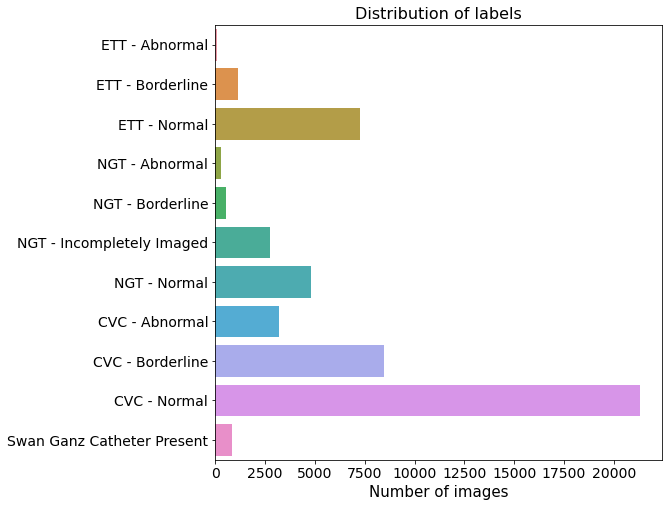

In [5]:
plt.figure(figsize=(8, 8))
df_tmp = df_train.iloc[:, :-1].sum()
sns.barplot(x=df_tmp.values, y=df_tmp.index)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Number of images", fontsize=15)
plt.title("Distribution of labels", fontsize=16);

In [62]:
print("Number of unique patients: ", df_train["PatientID"].unique().shape[0])

Number of unique patients:  3255


患者ごとの画像数をx軸に取り、撮影された画像数ごとにどれだけの患者が居るかをグラフにしている

05029c63a    172
55073fece    167
26da0d5ad    148
8849382d0    130
34242119f    110
Name: PatientID, dtype: int64


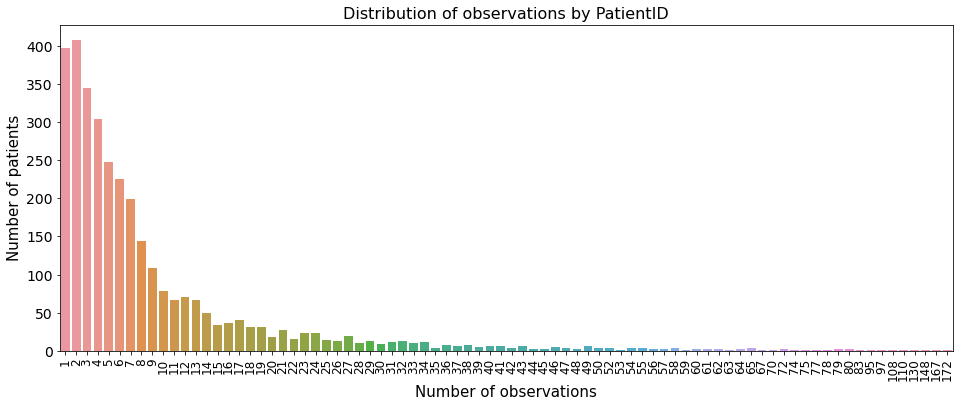

In [66]:
plt.figure(figsize=(16, 6))
df_tmp = df_train["PatientID"].value_counts()  # value_counts()はユニークな要素の値と出現回数を返す
print(df_tmp.head())
sns.countplot(x=df_tmp.values)  # .values はDataFrameのNumpy表現を返す
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=14)
plt.xlabel("Number of observations", fontsize=15)
plt.ylabel("Number of patients", fontsize=15)
plt.title("Distribution of observations by PatientID", fontsize=16);

## Annotations

**train_annotations.csv** these are segmentation annotations for training samples that have them. They are included solely as additional information for competitors.

In [8]:
df_annot = pd.read_csv(os.path.join(BASE_DIR, "train_annotations.csv"))
df_annot.head()

,StudyInstanceUID,label,data
0,1.2.826.0.1.3680043.8.498.12616281126973421762...,CVC - Normal,"[[1487, 1279], [1477, 1168], [1472, 1052], [14..."
1,1.2.826.0.1.3680043.8.498.12616281126973421762...,CVC - Normal,"[[1328, 7], [1347, 101], [1383, 193], [1400, 2..."
2,1.2.826.0.1.3680043.8.498.72921907356394389969...,CVC - Borderline,"[[801, 1207], [812, 1112], [823, 1023], [842, ..."
3,1.2.826.0.1.3680043.8.498.11697104485452001927...,CVC - Normal,"[[1366, 961], [1411, 861], [1453, 751], [1508,..."
4,1.2.826.0.1.3680043.8.498.87704688663091069148...,NGT - Normal,"[[1862, 14], [1845, 293], [1801, 869], [1716, ..."


撮影画像とカテーテル位置のアノテーションが施された画像を表示するための関数を用意する

In [69]:
def plot_image_with_annotations(row_ind):
    row = df_annot.iloc[row_ind]
    image_path = os.path.join(BASE_DIR, "train", row["StudyInstanceUID"] + ".jpg")  # 画像のIDをもとに該当する画像を持ってくる
    label = row["label"]
    data = np.array(ast.literal_eval(row["data"]))  # df_annotのdata列をevalで式として評価してNumpy配列にしている
    
    plt.figure(figsize=(10, 5))
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.subplot(1, 2, 2)
    plt.imshow(image)
    plt.scatter(data[:, 0], data[:, 1])  # df_annotのアノテーションを散布図として表現
    
    plt.suptitle(label, fontsize=15)

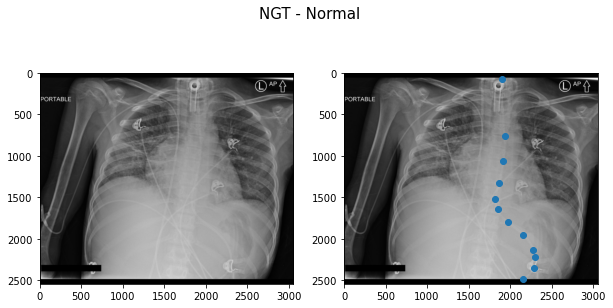

In [10]:
plot_image_with_annotations(8)

### visualize_annotations()
与えられたIDに対応するアノテーションが施された画像を表示するための関数を用意

In [11]:
# from https://www.kaggle.com/c/ranzcr-clip-catheter-line-classification/discussion/203353#1117642

def visualize_annotations(file_id):
    plt.figure(figsize=(8, 8))
    
    image = cv2.imread(os.path.join(BASE_DIR, "train", file_id + ".jpg"))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    
    df_patient = df_annot.loc[df_annot["StudyInstanceUID"] == file_id]
    
    if df_patient.shape[0]:        
        labels = df_patient["label"].values.tolist()
        lines = df_patient["data"].apply(ast.literal_eval).values.tolist()

        for line, label in zip(lines, labels):         
            line = np.asarray(line)
            plt.scatter(line[:, 0], line[:, 1], s=40, label=label)
        
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0, prop={'size': 20})
        
    plt.tick_params(axis="x", labelsize=15)
    plt.tick_params(axis="y", labelsize=15)
    
    plt.show()

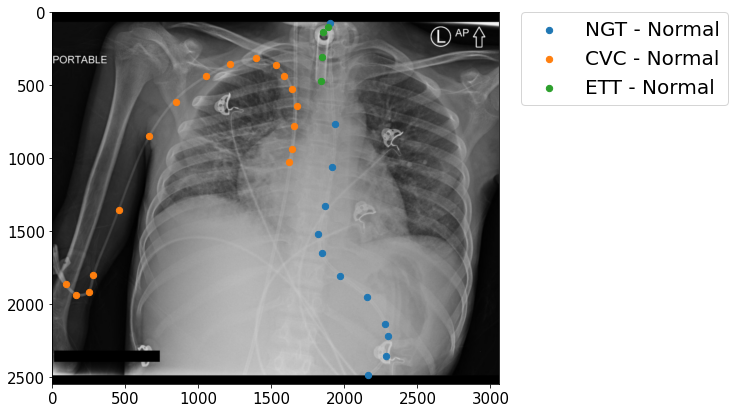

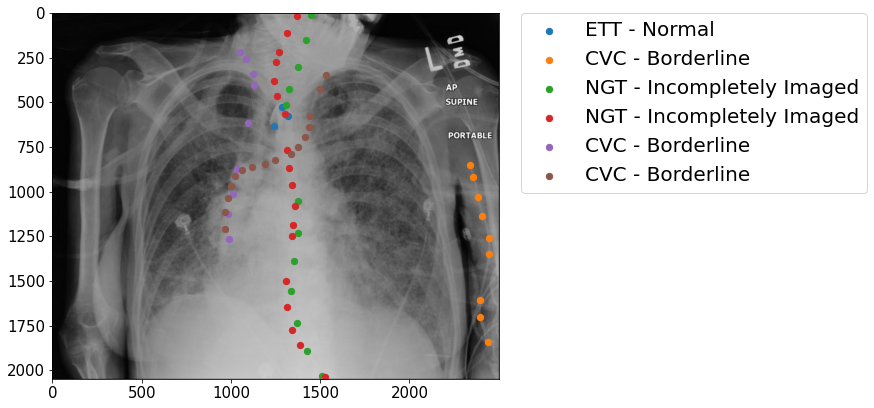

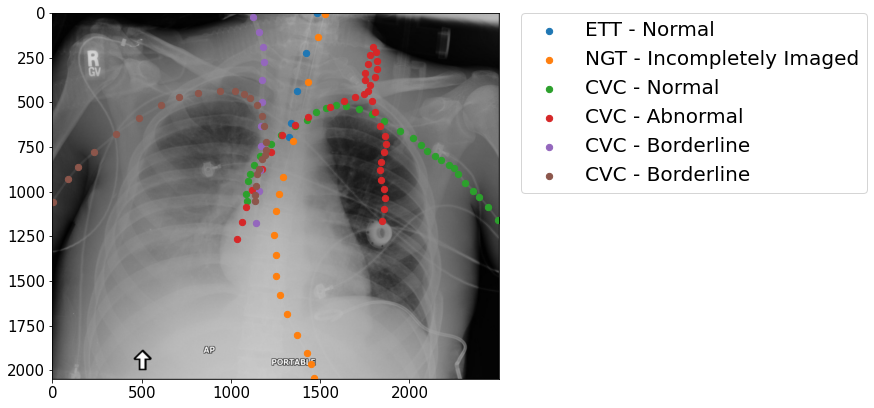

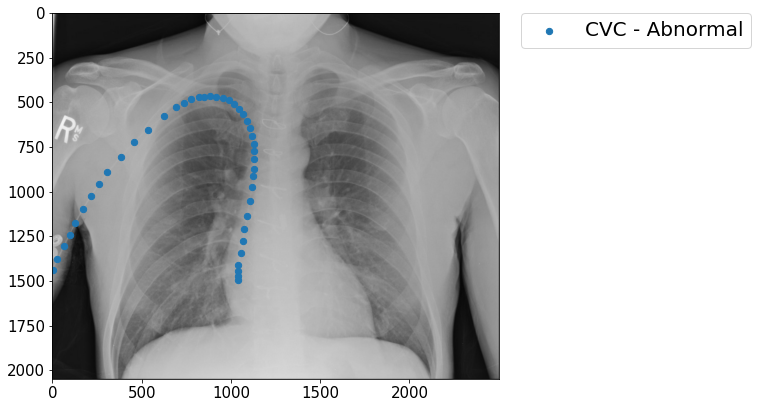

In [12]:
image_ids = [
    "1.2.826.0.1.3680043.8.498.83331936392921199432218327504041001669",
    "1.2.826.0.1.3680043.8.498.11693509889426445054876979814173446281",
    "1.2.826.0.1.3680043.8.498.15159015355212130418020059688126994534",
    "1.2.826.0.1.3680043.8.498.92067938763801985117661596637576203997",
]

for image_id in image_ids:
    visualize_annotations(image_id)

In [13]:
def visualize_batch(image_ids):
    plt.figure(figsize=(16, 10))
    
    for ind, image_id in enumerate(image_ids):
        plt.subplot(2, 3, ind + 1)
        image = cv2.imread(os.path.join(BASE_DIR, "train", f"{image_id}.jpg"))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image)
        plt.axis("off")
    
    plt.show()

    
def plot_statistics(df, col):
    plt.figure(figsize=(16, 2))
    sns.countplot(y=df[col])
    
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel("Number of observations", fontsize=15)
    plt.ylabel(col, fontsize=15)
    plt.title(f"Distribution of {col}", fontsize=16);
    
    plt.show()
#     
#     
#     
    

def process_class(col_name):
    plot_statistics(df_train, col_name)
    tmp_df = df_train[df_train[col_name] == 1]
    visualize_batch(random.sample(tmp_df.index.tolist(), 6))

### process_class()
与えられたクラスに該当する画像としない画像がそれぞれどのくらいあるか + ランダムなサンプル画像 を表示

## ETT - Abnormal

endotracheal tube placement abnormal

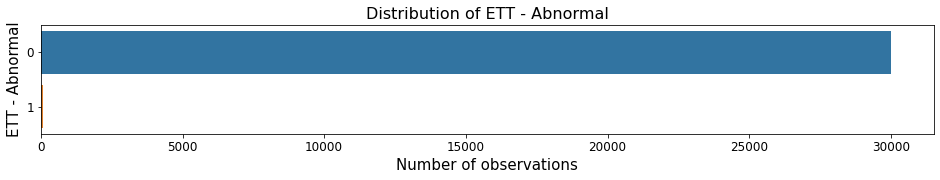

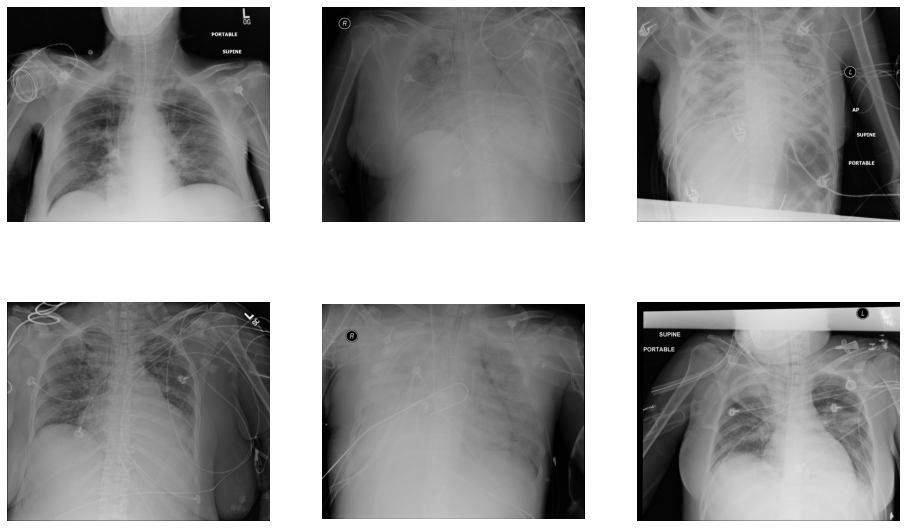

In [14]:
process_class("ETT - Abnormal")

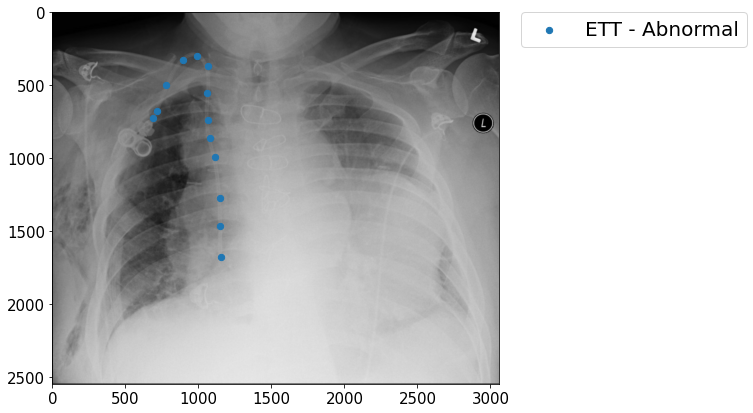

In [15]:
visualize_annotations("1.2.826.0.1.3680043.8.498.93345761486297843389996628528592497280")

## ETT - Borderline

endotracheal tube placement borderline abnormal

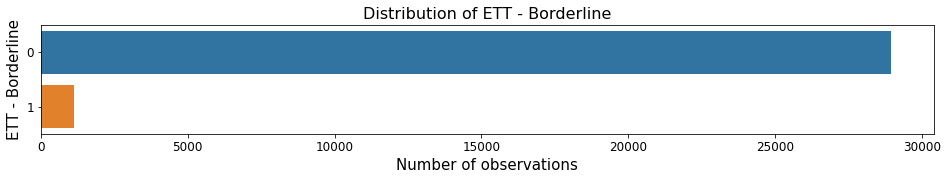

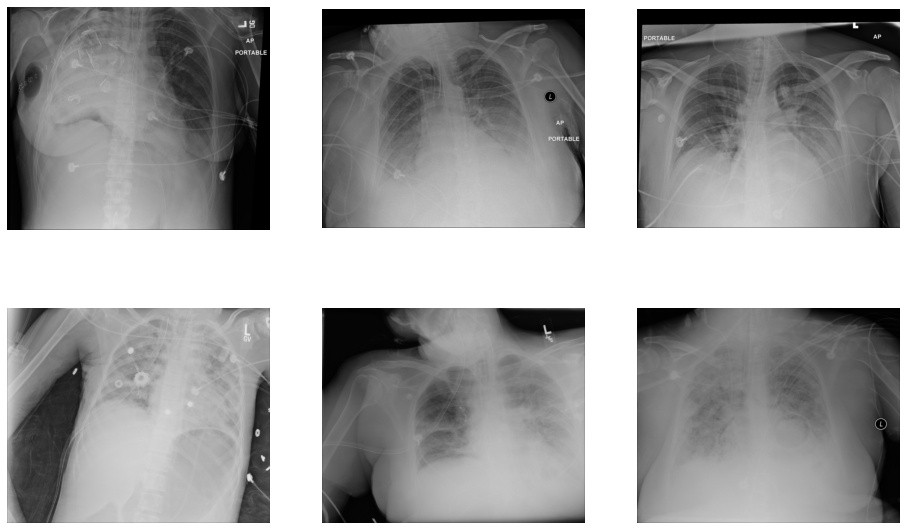

In [16]:
process_class("ETT - Borderline")

## ETT - Normal

endotracheal tube placement normal

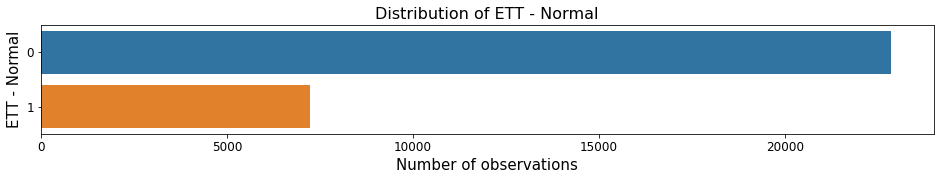

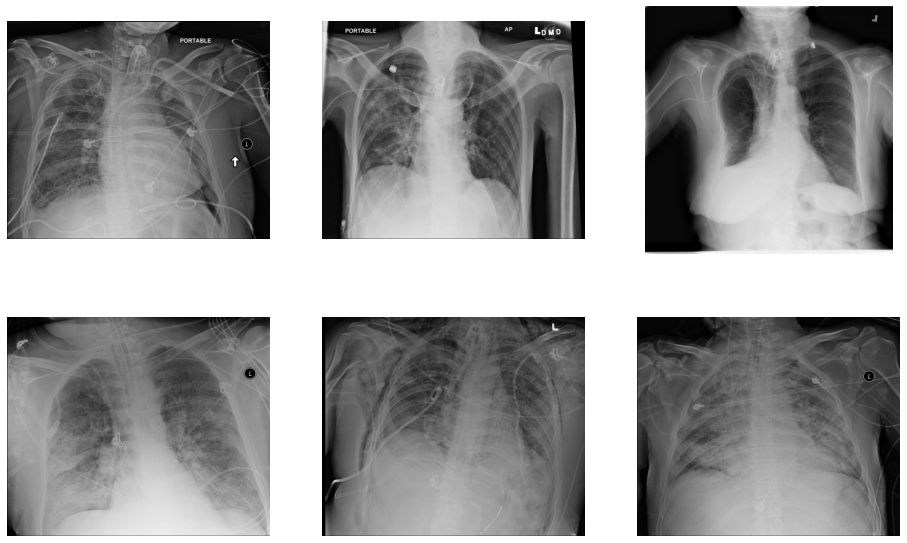

In [17]:
process_class("ETT - Normal")

## NGT - Abnormal

nasogastric tube placement abnormal

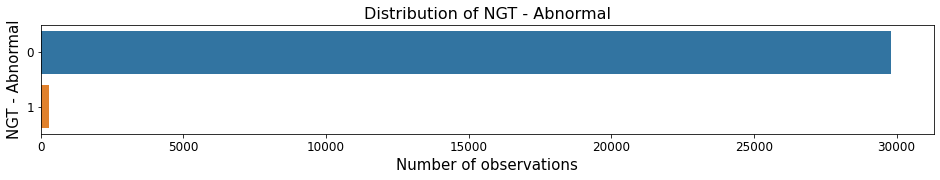

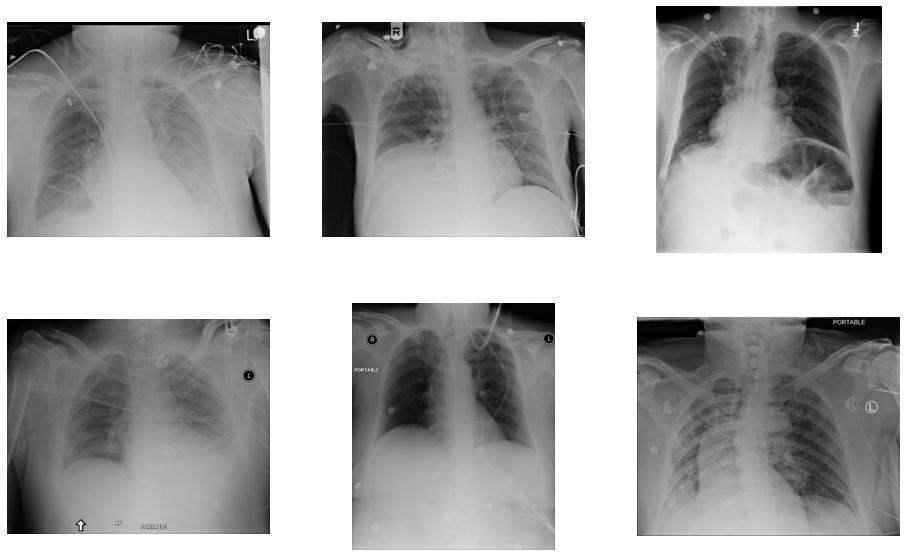

In [18]:
process_class("NGT - Abnormal")

## NGT - Borderline

nasogastric tube placement borderline abnormal

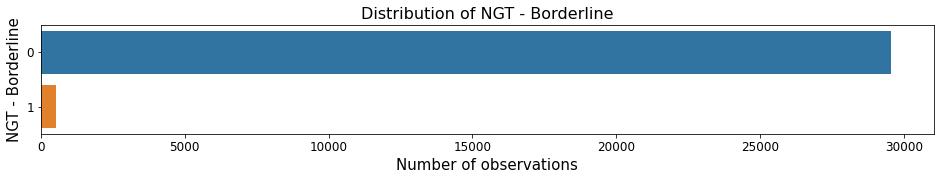

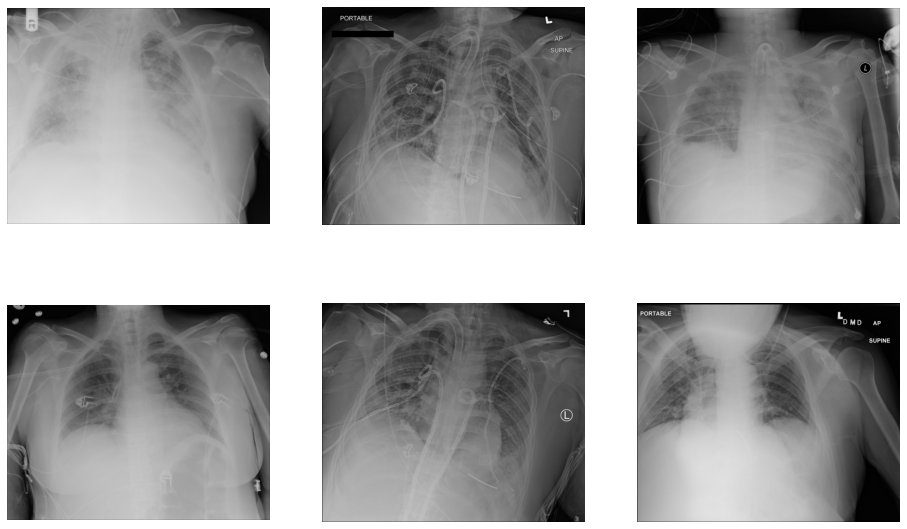

In [19]:
process_class("NGT - Borderline")

## NGT - Incompletely Imaged

nasogastric tube placement inconclusive due to imaging

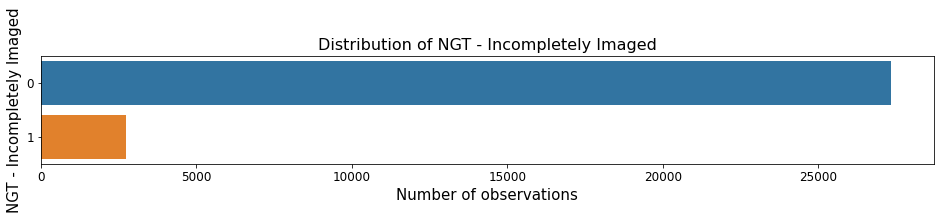

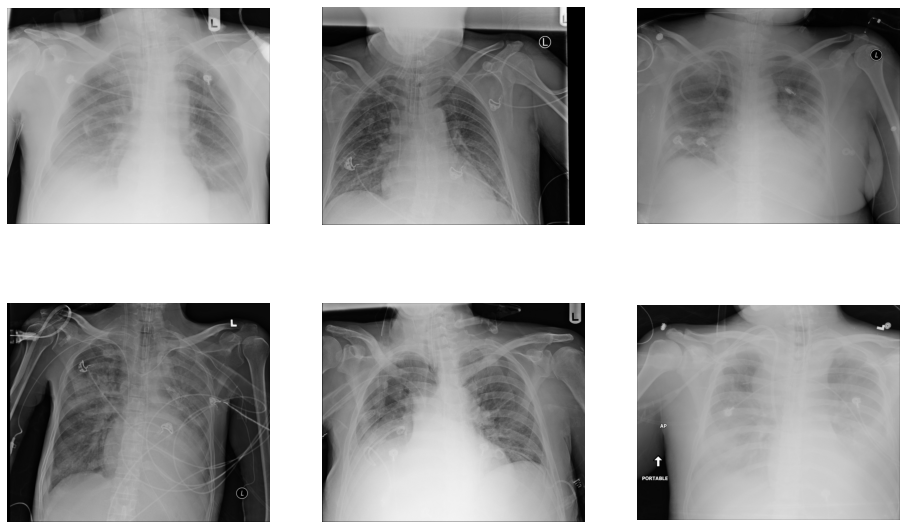

In [20]:
process_class("NGT - Incompletely Imaged")

## NGT - Normal

nasogastric tube placement borderline normal

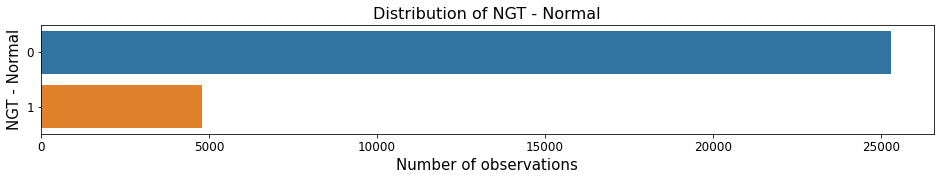

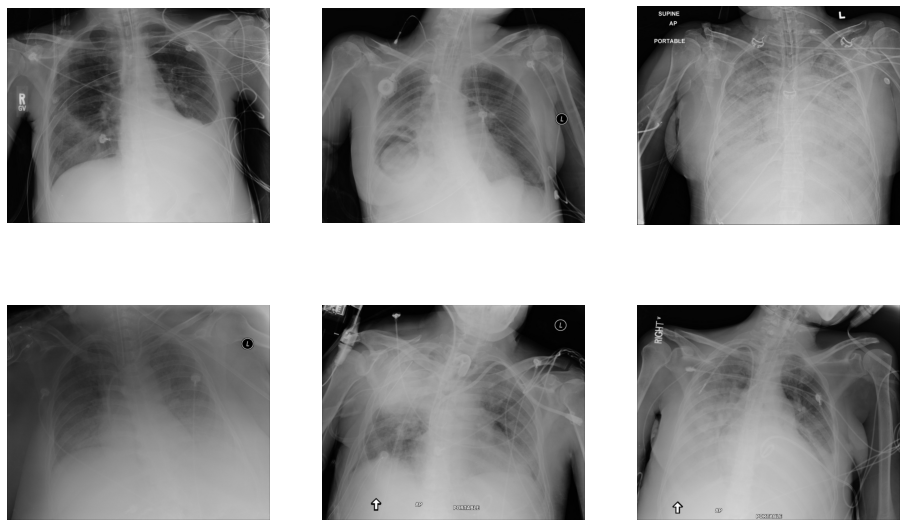

In [21]:
process_class("NGT - Normal")

## CVC - Abnormal

central venous catheter placement abnormal

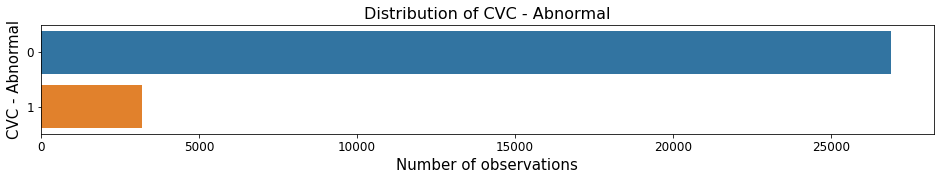

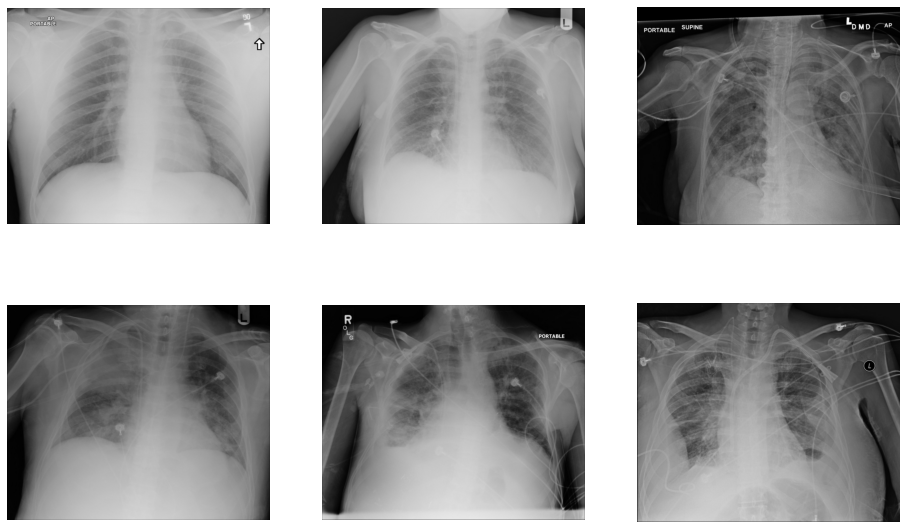

In [22]:
process_class("CVC - Abnormal")

## CVC - Borderline

central venous catheter placement borderline abnormal

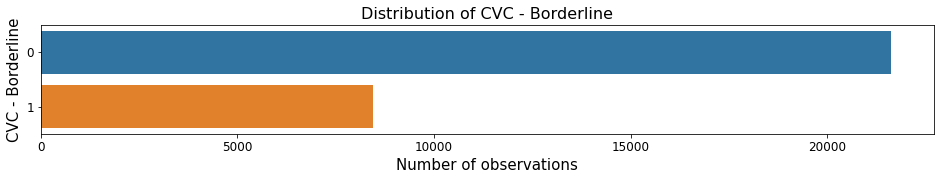

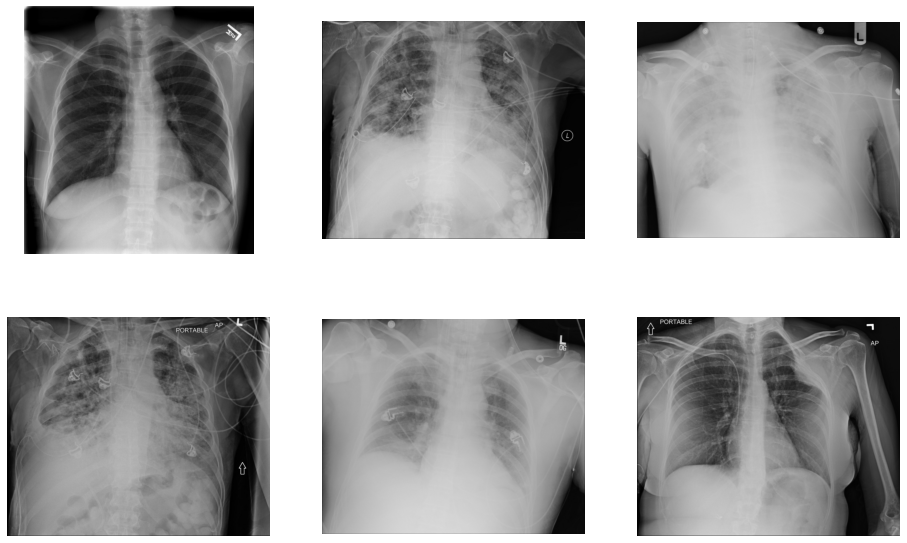

In [23]:
process_class("CVC - Borderline")

## CVC - Normal

central venous catheter placement normal

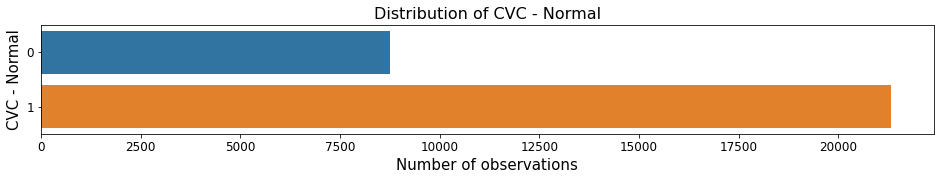

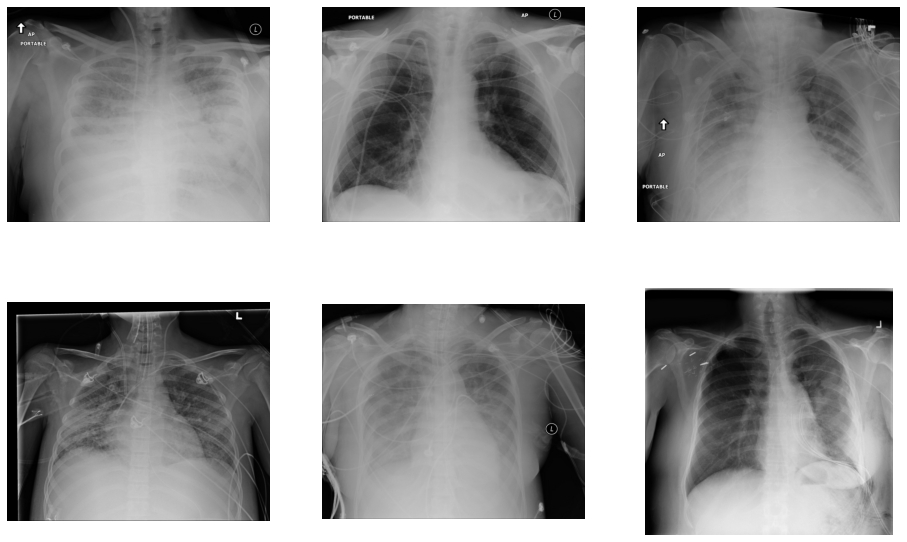

In [24]:
process_class("CVC - Normal")

## Swan Ganz Catheter Present

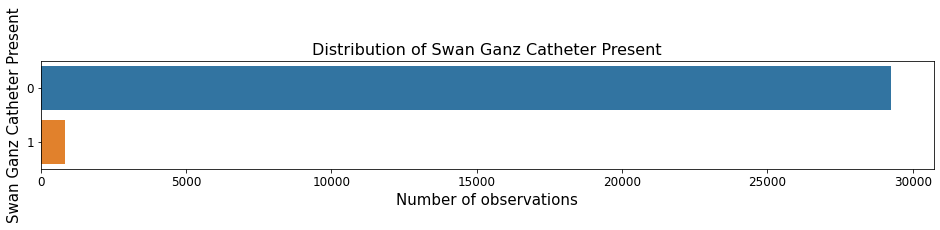

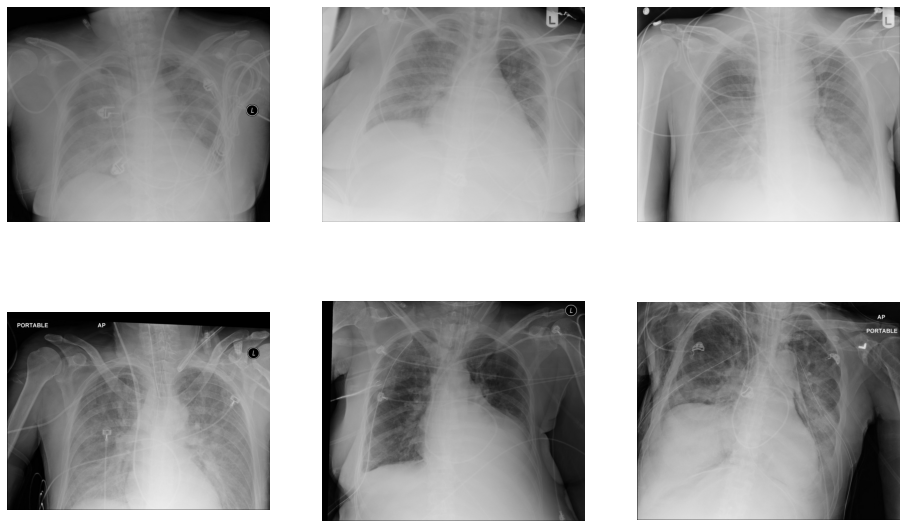

In [25]:
process_class("Swan Ganz Catheter Present")

## Venn Diagrams

### plot_venn2()
2つのクラスを与えた時、それぞれに属する画像の数に関するベン図を作成する

In [26]:
def plot_venn2(col_1, col_2):
    plt.figure(figsize=(6, 6))
    
    area_10 = df_train[col_1].sum()
    area_01 = df_train[col_2].sum()
    area_11 = df_train[(df_train[col_1] == 1) & (df_train[col_2] == 1)].shape[0]

    venn2(
        subsets=(area_10, area_01, area_11), 
        set_labels=(col_1, col_2),
        alpha=0.5,
    )

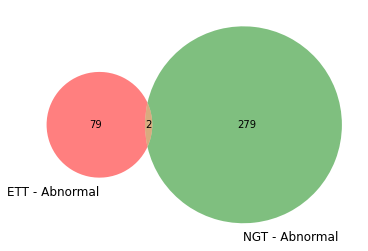

In [27]:
plot_venn2("ETT - Abnormal", "NGT - Abnormal")

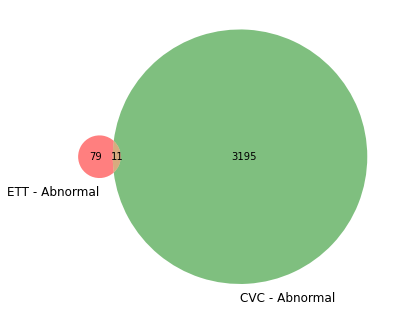

In [28]:
plot_venn2("ETT - Abnormal", "CVC - Abnormal")

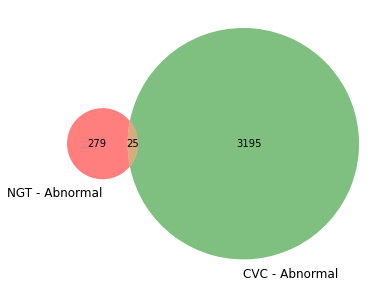

In [29]:
plot_venn2("NGT - Abnormal", "CVC - Abnormal")

In [30]:
def plot_venn3(col_1, col_2, col_3):
    plt.figure(figsize=(6, 6))
    
    area_100 = df_train[col_1].sum()
    area_010 = df_train[col_2].sum()
    area_110 = df_train[(df_train[col_1] == 1) & (df_train[col_2] == 1)].shape[0]
    area_001 = df_train[col_3].sum()
    area_101 = df_train[(df_train[col_1] == 1) & (df_train[col_3] == 1)].shape[0]
    area_011 = df_train[(df_train[col_2] == 1) & (df_train[col_3] == 1)].shape[0]
    area_111 = df_train[(df_train[col_1] == 1) & (df_train[col_2] == 1) & (df_train[col_3] == 1)].shape[0]

#     print(area_100, area_010, area_110, area_001, area_101, area_011, area_111)

    venn3(
        subsets=(area_100, area_010, area_110, area_001, area_101, area_011, area_111), 
        set_labels=(col_1, col_2, col_3), 
        alpha=0.5
    );

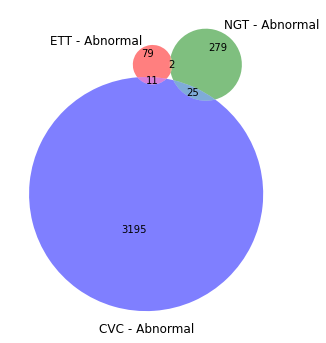

In [31]:
plot_venn3(
    "ETT - Abnormal",
    "NGT - Abnormal",
    "CVC - Abnormal",
)

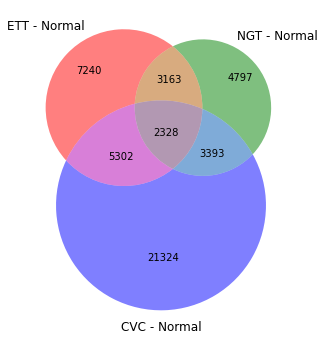

In [32]:
plot_venn3(
    "ETT - Normal",
    "NGT - Normal",
    "CVC - Normal",
)

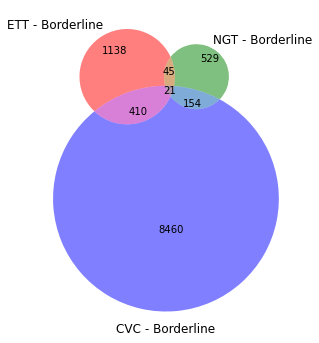

In [33]:
plot_venn3(
    "ETT - Borderline",
    "NGT - Borderline",
    "CVC - Borderline",
)

## Submission

**sample_submission.csv** - a sample submission file in the correct format

サンプルとして提供されているCSVをそのまま提出している

In [34]:
df_submission = pd.read_csv(os.path.join(BASE_DIR, "sample_submission.csv"), index_col=0)
df_submission

,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
StudyInstanceUID,,,,,,,,,,,
1.2.826.0.1.3680043.8.498.46923145579096002617106567297135160932,0,0,0,0,0,0,0,0,0,0,0
1.2.826.0.1.3680043.8.498.84006870182611080091824109767561564887,0,0,0,0,0,0,0,0,0,0,0
1.2.826.0.1.3680043.8.498.12219033294413119947515494720687541672,0,0,0,0,0,0,0,0,0,0,0
1.2.826.0.1.3680043.8.498.84994474380235968109906845540706092671,0,0,0,0,0,0,0,0,0,0,0
1.2.826.0.1.3680043.8.498.35798987793805669662572108881745201372,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1.2.826.0.1.3680043.8.498.81464483108873296584005201807676213920,0,0,0,0,0,0,0,0,0,0,0
1.2.826.0.1.3680043.8.498.33579133018211530710953337175568300314,0,0,0,0,0,0,0,0,0,0,0
1.2.826.0.1.3680043.8.498.61472811086105902907935935811857560107,0,0,0,0,0,0,0,0,0,0,0


In [35]:
df_submission.to_csv("submission.csv")